In [9]:
import scanpy as sc
import squidpy as sq

import numpy as np
import pandas as pd

In [11]:
import os
from pathlib import Path
directory = Path('Benchmarking_results/slide-seqv2')

glb = directory.rglob('*.npy')
files = [str(file) for file in glb if file.is_file()]

adata = sc.read_h5ad('datasets/slideseqv2/slideseqv2_raw.h5ad')
adata = adata[:,adata.var['highly_variable_rank']<2000].copy()
sc.pp.filter_cells(adata,min_genes=20)
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
adata.obs['maxval'] = adata.obsm['deconvolution_results']['maxval'].values

import os
from pathlib import Path
directory = Path('Benchmarking_results/slide-seqv2')
glb = directory.rglob('*.npy')
files = [str(file) for file in glb if file.is_file()]
file_list = sorted(files)

for filename in file_list:
    name = filename[33:-4]
    adata.obsm[name] = np.load(filename)
    
for i in range(10):
    adata.obsm['GraphST'+str(i)] = sc.pp.pca(adata.obsm['GraphST'+str(i)])


from simvi.model import SimVI
edge_index = SimVI.extract_edge_index(adata,n_neighbors=10)
import numpy as np
from scipy.sparse import coo_matrix, csr_matrix
coo = coo_matrix((np.ones(edge_index[0].shape[0]), (edge_index[0].numpy(), edge_index[1].numpy())), shape=(adata.shape[0],adata.shape[0]))
for i in range(10):
    adata.obsm['scviavg'+str(i)] = 0.1 * coo.toarray() @ adata.obsm['scvi'+str(i)]
    adata.obsm['cellcharter'+str(i)] = np.hstack((adata.obsm['scvi'+str(i)],adata.obsm['scviavg'+str(i)]))



In [12]:
sc.pp.pca(adata)

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


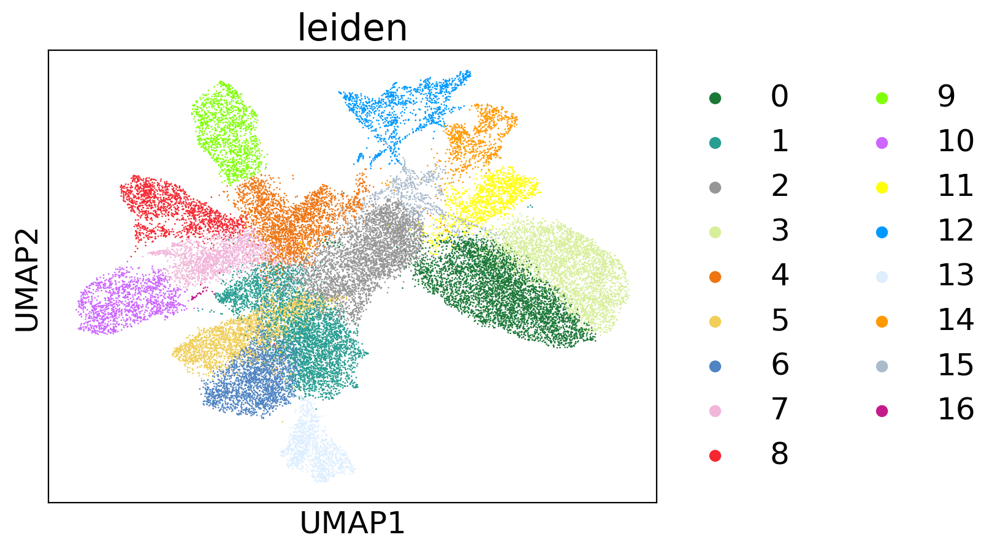

In [201]:
#sc.pp.neighbors(adata,use_rep='simvi2k_s2')
#sc.tl.leiden(adata,resolution=0.55)
sc.tl.umap(adata)
sc.pl.umap(adata,color='leiden',palette = palette_20_,save='slideseqv2_simvi.pdf')

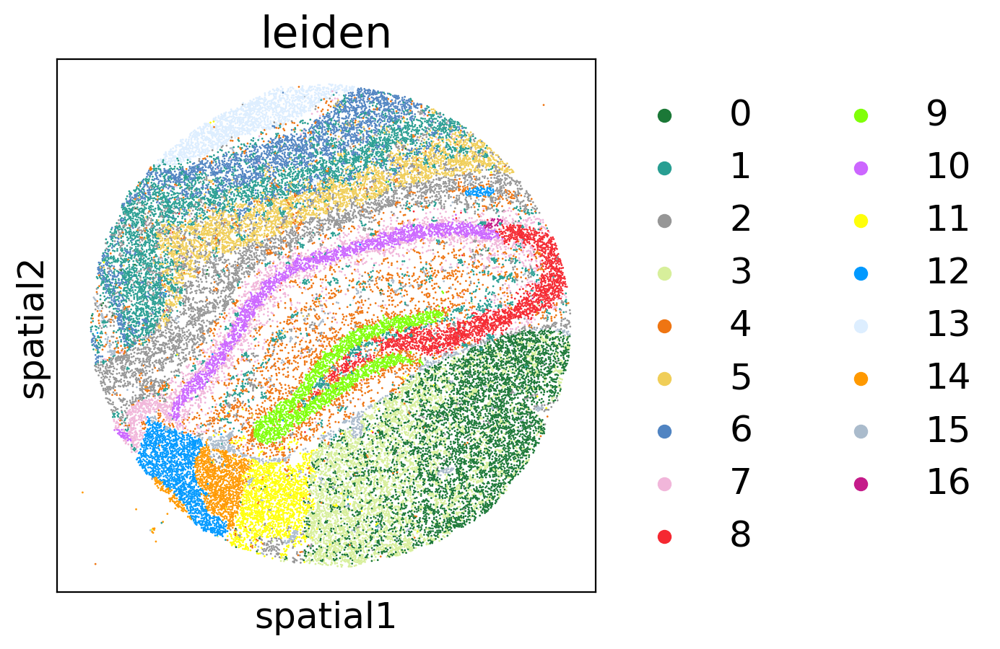

In [200]:
palette_20_ = [
    '#1b7837',
    '#289E92',
    '#969696',
    '#D7EF9B',
    '#EF7512',
    '#F0CE58',
    '#5084C2',
    '#f1b6da',
    '#F52831',
    '#80FF08',
    '#CC66FF',
    '#FFFF0A',
    '#0099FF',
    '#DDEEFF',
    '#FF9900',
    '#AABBCC',
    '#c51b8a']
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 200
plt.rcParams["font.size"] = 18
sc.pl.spatial(adata,color=['leiden'],wspace=1,spot_size=20,palette=palette_20_,save='slideseqv2_simvi.pdf')

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


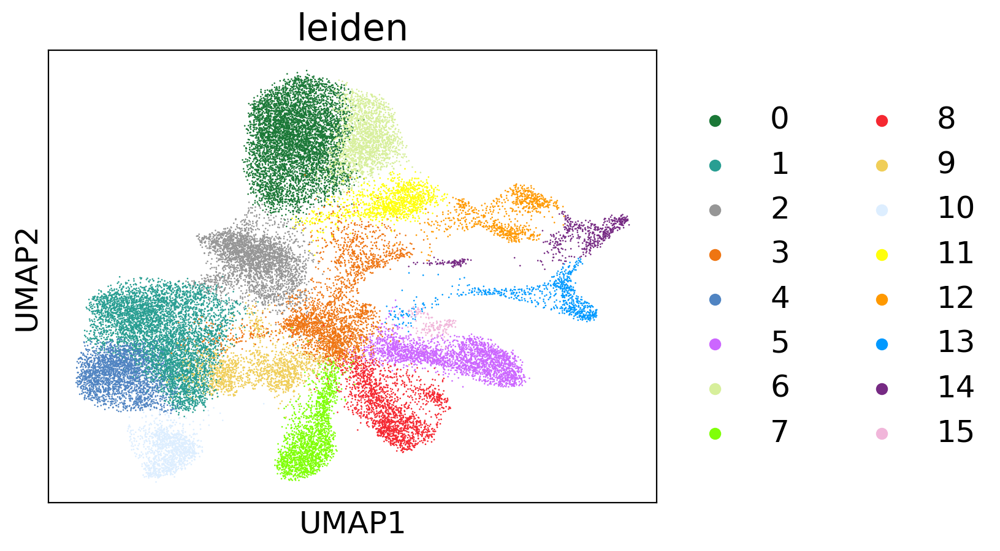

In [206]:
#sc.pp.neighbors(adata,use_rep='cellcharter2')
#sc.tl.leiden(adata,resolution=0.9)
sc.tl.umap(adata)
sc.pl.umap(adata,color='leiden',palette = palette_cellcharter,save='slideseqv2_cellcharter.pdf')

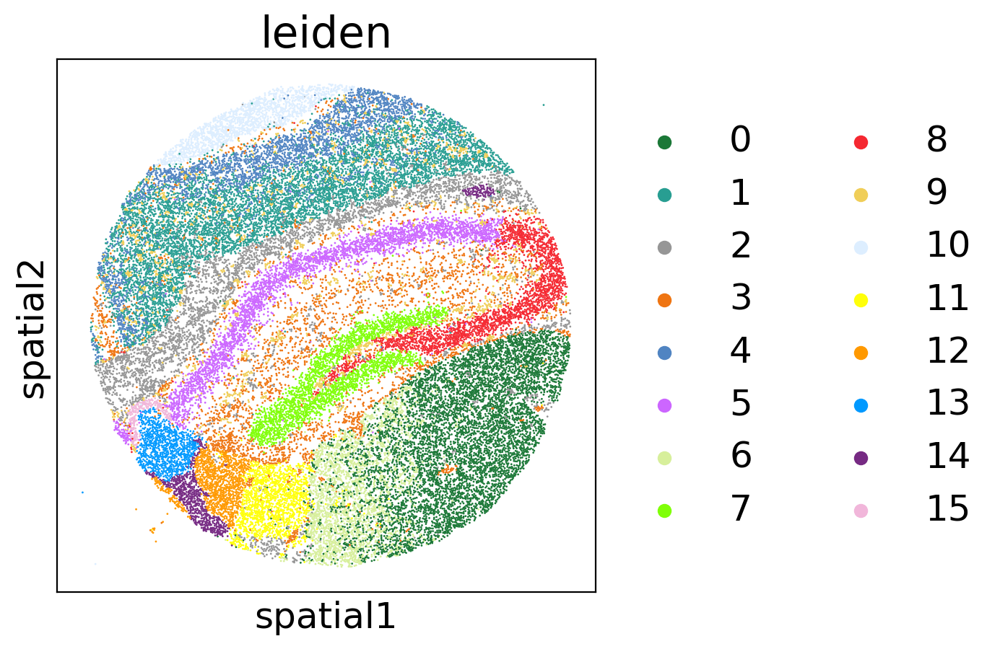

In [205]:
palette_cellcharter = [
    '#1b7837',
    '#289E92',
    '#969696',
    '#EF7512',
    '#5084C2',
    '#CC66FF',
    '#D7EF9B',
    '#80FF08',
    '#F52831',
    '#F0CE58',
    '#DDEEFF',
    '#FFFF0A',
    '#FF9900',
    '#0099FF',
    '#762a83',
    '#f1b6da',
    '#7F7F7F']

sc.pl.spatial(adata,color=['leiden'],wspace=1,spot_size=20, palette = palette_cellcharter,save='slideseqv2_cellcharter.pdf')

/usr/local/lib/python3.8/dist-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


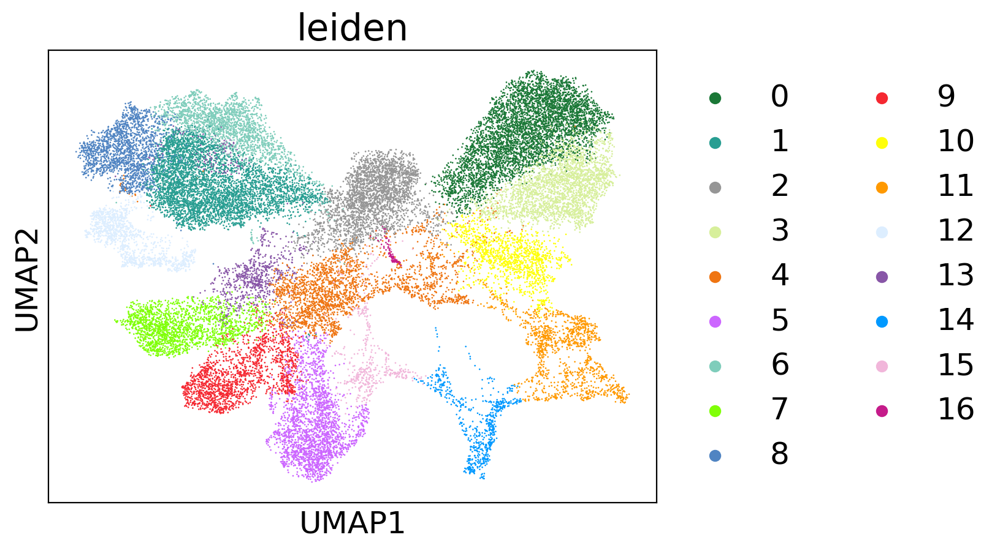

In [212]:
#sc.pp.neighbors(adata,use_rep='GraphST0')
#sc.tl.leiden(adata,resolution=0.6)
sc.tl.umap(adata)
sc.pl.umap(adata,color='leiden',palette = palette_graphst,save='slideseqv2_graphst.pdf')

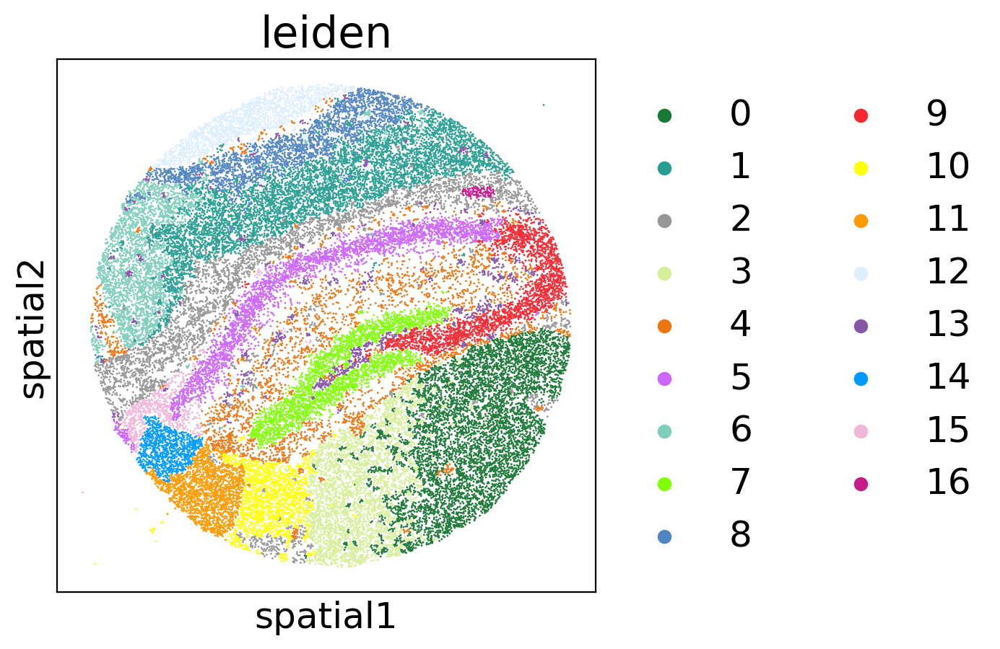

In [211]:
palette_graphst = [
    '#1b7837',
    '#289E92',
    '#969696',
    '#D7EF9B',
    '#EF7512',
    '#CC66FF',
    '#7fcdbb',
    '#80FF08',
    '#5084C2',
    '#F52831',
    '#FFFF0A',
    '#FF9900',
    '#DDEEFF',
    '#8856a7',
    '#0099FF',
    '#f1b6da',
    '#c51b8a']

sc.pl.spatial(adata,color=['leiden'],wspace=1,spot_size=20, palette = palette_graphst,save='slideseqv2_graphst.pdf')

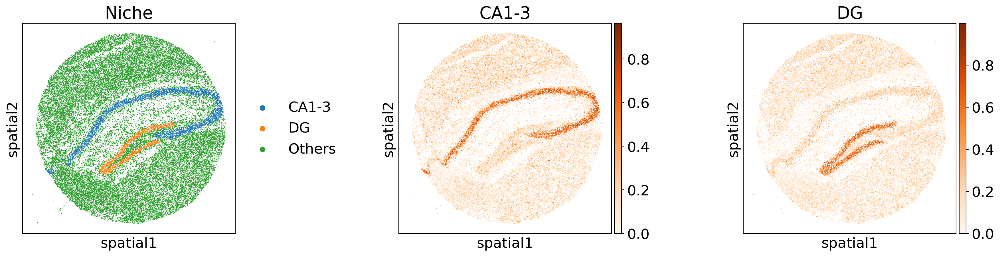

In [246]:


adata.obs['CA1-3'] = adata.obsm['deconvolution_results']['CA1_CA2_CA3_Subiculum'].values
adata.obs['DG'] = adata.obsm['deconvolution_results']['DentatePyramids'].values

adata.obs['DG'] = adata.obs['DG'] + 0.15 * coo.toarray() @ adata.obs['DG']
adata.obs['CA1-3'] = adata.obs['CA1-3'] + 0.15 * coo.toarray() @ adata.obs['CA1-3']





adata.obs['Niche'] = 'Others'
adata.obs['Niche'][adata.obs['DG']>1.1] = 'DG'
adata.obs['Niche'][adata.obs['CA1-3']>0.9] = 'CA1-3'



adata.obs['CA1-3'] = adata.obsm['deconvolution_results']['CA1_CA2_CA3_Subiculum'].values
adata.obs['DG'] = adata.obsm['deconvolution_results']['DentatePyramids'].values

sc.pl.spatial(adata,color=['Niche','CA1-3','DG'],spot_size=20,cmap='Oranges',save='slide-seqv2niche.pdf')

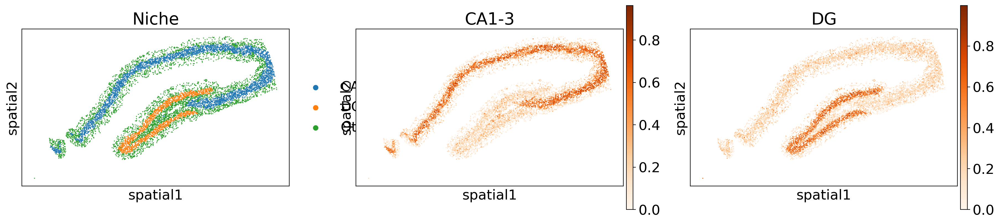

In [251]:
from simvi.model import SimVI
edge_index = SimVI.extract_edge_index(adata,n_neighbors=100)
import numpy as np
from scipy.sparse import coo_matrix, csr_matrix
coo = coo_matrix((np.ones(edge_index[0].shape[0]), (edge_index[0].numpy(), edge_index[1].numpy())), shape=(adata.shape[0],adata.shape[0]))

adata.obs['Niche_neighbor'] = (coo.toarray() @ (adata.obs['Niche']!='Others')) > 5
sc.pl.spatial(adata[adata.obs['Niche_neighbor']],color=['Niche','CA1-3','DG'],spot_size=20,cmap='Oranges')

In [252]:
adata_2 = adata[adata.obs['Niche_neighbor']].copy()

bm2 = Benchmarker(
    adata_2,
    batch_key="leiden",
    label_key="Niche",
    embedding_obsm_keys=s_list,
    pre_integrated_embedding_obsm_key='X_pca',
    bio_conservation_metrics=biocons,
    batch_correction_metrics=bat,
    n_jobs=20,
)
bm2.benchmark()

/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  self._emb_adatas[emb_key] = AnnData(self._adata.obsm[emb_key], obs=self._adata.obs)
/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  self._emb_adatas[emb_key] = AnnData(self._adata.obsm[emb_key], obs=self._adata.obs)
/usr/local/lib/python3.8/dist-packages/scib_metrics/benchmark/_core.py:178: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                             

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                             

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                             

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                                                                                                              
Metrics:   0%|                                                                                                                                                                                                                                         | 0/10 [00:00<?, ?it/s]
                                                                                                                                                                                           

In [284]:
bm2._results.to_csv('Benchmarking_results/slideseqv2_niche.csv')